In [1]:
from urllib.request import urlopen
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
import urllib
import time
import ssl
import os

# only to previne ssl problems
ssl._create_default_https_context = ssl._create_unverified_context

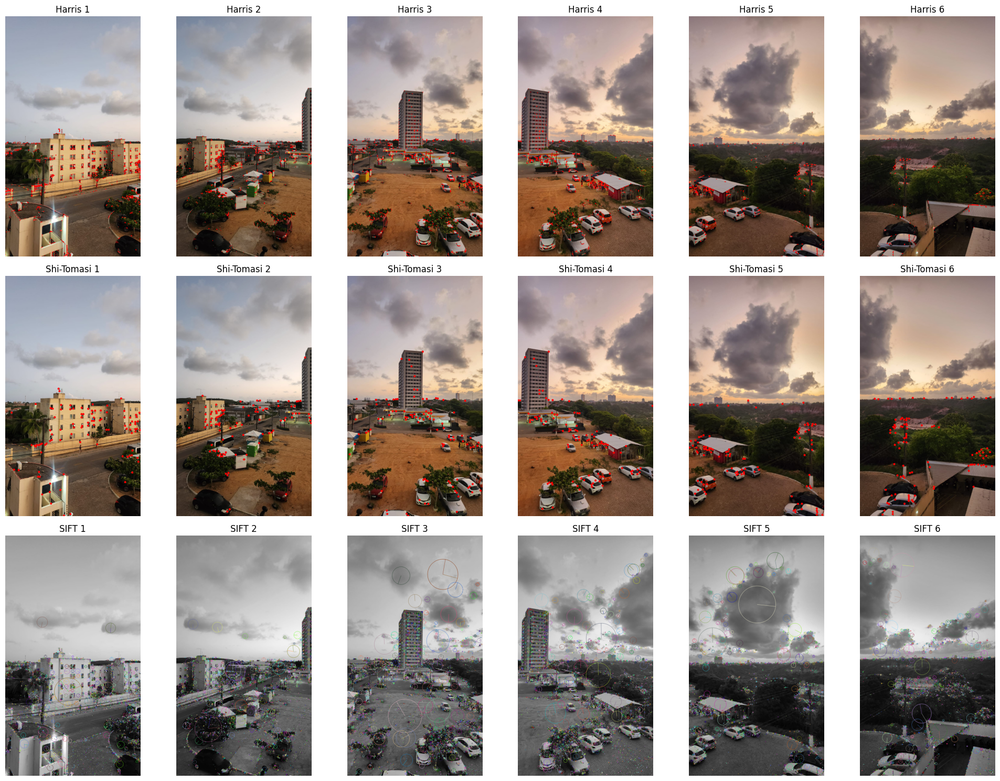

Harris execution time: 16.19 seconds
Shi-Tomasi execution time: 2.02 seconds
SIFT execution time: 4.58 seconds


In [2]:
#QUESTAO I:

def load_image_from_url(url):
    try:
        with urllib.request.urlopen(url) as response:
            img_array = np.asarray(bytearray(response.read()), dtype=np.uint8)
            return cv.imdecode(img_array, cv.IMREAD_COLOR)
    except Exception as e:
        print(f"Erro no URL {url}: {e}")
        return None

image_urls = [
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/01.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/02.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/03.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/04.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/05.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/06.jpeg"
]

fig, axes = plt.subplots(3, 6, figsize=(20, 15))

# Harris Corner Detector
start_time = time.time()
for idx, url in enumerate(image_urls):
    img = load_image_from_url(url)
    if img is None:
        continue

    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    gray = np.float32(gray)

    blocksize = 2
    ksize = 7
    k = 0.04
    dst = cv.cornerHarris(gray, blocksize, ksize, k)
    dst = cv.dilate(dst, None)

    img[dst > 0.01 * dst.max()] = [0, 0, 255]

    axes[0, idx].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    axes[0, idx].axis('off')
    axes[0, idx].set_title(f'Harris {idx+1}')
harris_time = time.time() - start_time

# Shi-Tomasi Corner Detector
start_time = time.time()
for idx, url in enumerate(image_urls):
    img = load_image_from_url(url)
    if img is None:
        continue

    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    maxCorners = 100
    qualityLevel = 0.01
    minDistance = 10
    corners = cv.goodFeaturesToTrack(gray, maxCorners, qualityLevel, minDistance)
    corners = np.int_(corners)

    result = img.copy()

    for corner in corners:
        x, y = corner.ravel()
        cv.circle(result, (x, y), 7, [0, 0, 255], -1)

    axes[1, idx].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
    axes[1, idx].axis('off')
    axes[1, idx].set_title(f'Shi-Tomasi {idx+1}')
shi_tomasi_time = time.time() - start_time

# SIFT Detector
start_time = time.time()
for idx, url in enumerate(image_urls):
    img = load_image_from_url(url)
    if img is None:
        continue

    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    nfeatures = 0
    nOctaveLayers = 3
    contrastThreshold = 0.04
    edgeThreshold = 10
    sigma = 1.6
    sift = cv.SIFT_create(
        nfeatures=nfeatures,
        nOctaveLayers=nOctaveLayers,
        contrastThreshold=contrastThreshold,
        edgeThreshold=edgeThreshold,
        sigma=sigma
    )

    kp = sift.detect(gray, None)
    result = cv.drawKeypoints(gray, kp, img, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    axes[2, idx].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
    axes[2, idx].axis('off')
    axes[2, idx].set_title(f'SIFT {idx+1}')
sift_time = time.time() - start_time

plt.tight_layout()
plt.show()

print(f"Harris execution time: {harris_time:.2f} seconds")
print(f"Shi-Tomasi execution time: {shi_tomasi_time:.2f} seconds")
print(f"SIFT execution time: {sift_time:.2f} seconds")

QUESTÃO I - Análise dos Detectores de Cantos/Features

CornerHarris<br>
O detector de Corner Harris analisa as variações em direção do gradiente pra encontrar quinas, ele gerou bastante keypoints em áreas de cantos e em bordas que tem bastante contraste (janelas principalmente). Principais parâmetros:
- blockSize: tamanho da vizinhança do pixel.
- ksize: tamanho do kernel na derivada Sobel.
- k: parâmetro de ajuste para sensibilidade.

Shi-Tomasi <br>
Também é um detector de cantos, mas se baseia em valores mínimos para selecionar os melhores pontos. No teste, gerou menos features, mas bem distribuídas e para o caso do nosso teste, foram bem úteis para rastreamento espacial e com ótima performance. Principais parâmetros:
- maxCorners: número máximo de cantos.
- qualityLevel: qualidade mínima aceitável.
- minDistance: distância mínima entre as detecções.

SIFT (Scale-Invariant Feature Transform) <br>
Detecta pontos analisando a imagem em múltiplas escalas (diferentes desfoques) via filtro Difference of Gaussians (DoG). Ele detectou features até em superfícies pouco definidas (como nuvens, paredes, centro de objetos), aparente captura detalhes de textura e contraste. Apresentou maior custo computacional dentre os 3. Principais parâmetros:
- nfeatures: limite de features.
- contrastThreshold: filtra cantos de baixo contraste.
- edgeThreshold: controla quão perto de bordas o detector vai atuar.
- sigma: suavização na pirâmide de escalas.

Qual foi o melhor? <br>
O Harris é bom para quinas bem definidas, mas sensível a ruídos em áreas homogêneas.
O Shi-Tomasi teve bom equilíbrio entre velocidade e distribuição de pontos, ajudando no rastreamento.
O SIFT é robusto a mudanças de escala, mas é o mais lento.
Para este cenário, escolhi o Shi-Tomasi como o melhor compromisso entre desempenho e distribuição de pontos.

SIFT descriptor time: 4.31 s
ORB descriptor time: 3.27 s
BRISK descriptor time: 3.54 s


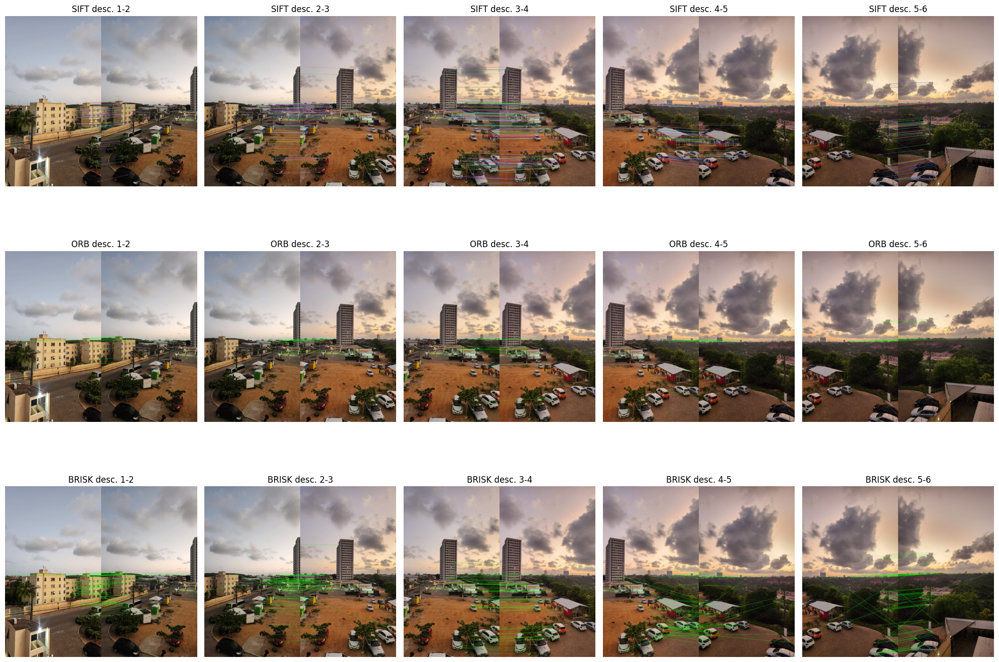

In [3]:
# QUESTÃO II:

def load_image_from_url(url):
    """Carrega uma imagem diretamente da URL"""
    try:
        with urllib.request.urlopen(url) as response:
            img_array = np.asarray(bytearray(response.read()), dtype=np.uint8)
            return cv.imdecode(img_array, cv.IMREAD_COLOR)
    except Exception as e:
        print(f"Erro ao carregar imagem da URL {url}: {e}")
        return None

image_urls = [
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/01.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/02.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/03.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/04.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/05.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/06.jpeg"
]

fig, axes = plt.subplots(3, 5, figsize=(20, 15))

# Função comum para os descritores
def detect_keypoints(gray):
    maxCorners = 500
    qualityLevel = 0.01
    minDistance = 10
    corners = cv.goodFeaturesToTrack(gray, maxCorners, qualityLevel, minDistance)
    keypoints = [cv.KeyPoint(x=float(x), y=float(y), size=7) for [[x, y]] in corners]
    return keypoints

# SIFT descriptor com detector do Shi-Tomasi
start_time = time.time()
for idx in range(len(image_urls)-1):
    img1 = load_image_from_url(image_urls[idx])
    img2 = load_image_from_url(image_urls[idx+1])

    if img1 is None or img2 is None:
        continue

    gray1, gray2 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY), cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

    # Detector ST
    kp1 = detect_keypoints(gray1)
    kp2 = detect_keypoints(gray2)

    # Descriptor SIFT
    sift = cv.SIFT_create()
    kp1, des1 = sift.compute(gray1, kp1)
    kp2, des2 = sift.compute(gray2, kp2)

    # Matching com FLANN
    if des1 is not None and des2 is not None:
        flann = cv.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=50))
        matches = flann.knnMatch(des1, des2, k=2)

        good_matches = []
        for m, n in matches:
            if m.distance < 0.7 * n.distance:
                good_matches.append(m)

        result = cv.drawMatches(img1, kp1, img2, kp2, good_matches, None)
    else:
        result = np.hstack((img1, img2))

    axes[0, idx].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
    axes[0, idx].set_title(f'SIFT desc. {idx+1}-{idx+2}')
    axes[0, idx].axis('off')

sift_time = time.time() - start_time

# ORB descriptor com Shi-Tomasi detector
start_time = time.time()
for idx in range(len(image_urls)-1):
    img1 = load_image_from_url(image_urls[idx])
    img2 = load_image_from_url(image_urls[idx+1])

    if img1 is None or img2 is None:
        continue

    gray1, gray2 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY), cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

    # Detector ST
    kp1 = detect_keypoints(gray1)
    kp2 = detect_keypoints(gray2)

    # Descriptor ORB
    orb = cv.ORB_create()
    kp1, des1 = orb.compute(gray1, kp1)
    kp2, des2 = orb.compute(gray2, kp2)

    # Matching com BruteForce
    if des1 is not None and des2 is not None:
        bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)[:10]

        result = cv.drawMatches(img1, kp1, img2, kp2, matches, None,
                              matchColor=(0, 255, 0),
                              singlePointColor=(255, 0, 0),
                              flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    else:
        result = np.hstack((img1, img2))

    axes[1, idx].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
    axes[1, idx].set_title(f'ORB desc. {idx+1}-{idx+2}')
    axes[1, idx].axis('off')

orb_time = time.time() - start_time

# BRISK descriptor com Shi-Tomasi detector
start_time = time.time()
for idx in range(len(image_urls)-1):
    img1 = load_image_from_url(image_urls[idx])
    img2 = load_image_from_url(image_urls[idx+1])

    gray1, gray2 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY), cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

    # Detector ST
    kp1 = detect_keypoints(gray1)
    kp2 = detect_keypoints(gray2)

    # Descriptor BRISK
    brisk = cv.BRISK_create()
    kp1, des1 = brisk.compute(gray1, kp1)
    kp2, des2 = brisk.compute(gray2, kp2)

    # Matching com BruteForce
    if des1 is not None and des2 is not None:
        bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
        matches = bf.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)[:50]

        result = cv.drawMatches(img1, kp1, img2, kp2, matches, None,
                              matchColor=(0, 255, 0),
                              singlePointColor=(255, 0, 0),
                              flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    else:
        result = np.hstack((img1, img2))

    axes[2, idx].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
    axes[2, idx].set_title(f'BRISK desc. {idx+1}-{idx+2}')
    axes[2, idx].axis('off')

brisk_time = time.time() - start_time

print(f"SIFT descriptor time: {sift_time:.2f} s")
print(f"ORB descriptor time: {orb_time:.2f} s")
print(f"BRISK descriptor time: {brisk_time:.2f} s")

plt.tight_layout()
plt.show()

QUESTÃO II:<br>
Utilizei o método Shi-Tomasi como detector para encontrar os pontos de interesse (features/keypoints) em todas as imagens. Posterior, aproveito esses mesmos pontos localizados e aplico cada um dos descritores (escolhidos por mim, exceto pelo SIFT que foi pedido no enunciado da questão):

- SIFT: Baseia-se em gradientes para gerar descritores em float (em 128 dimensões). Normalmente por ser em foat é mais preciso e também "resistente" a mudanças de escala. No matching, usei o FLANN para lidar com essas dimensões.

- ORB: ORB: Embora dê para utilizar ORB combinado com FAST (detector) e com o BRIEF (descritor), aqui aproveitei apenas a função do descritor. Ele gera vetores binários, são bem mais leves e rápidos para comparar.

- BRISK: Também binário, mas funciona a partir de um padrão circular que aparentemente capta informações de vizinhança. Não foi tão rápido quanto o ORB e aqui usamos o BFMatcher porque ele lida bem com dados binários.

9 rótulos
4 iamgens


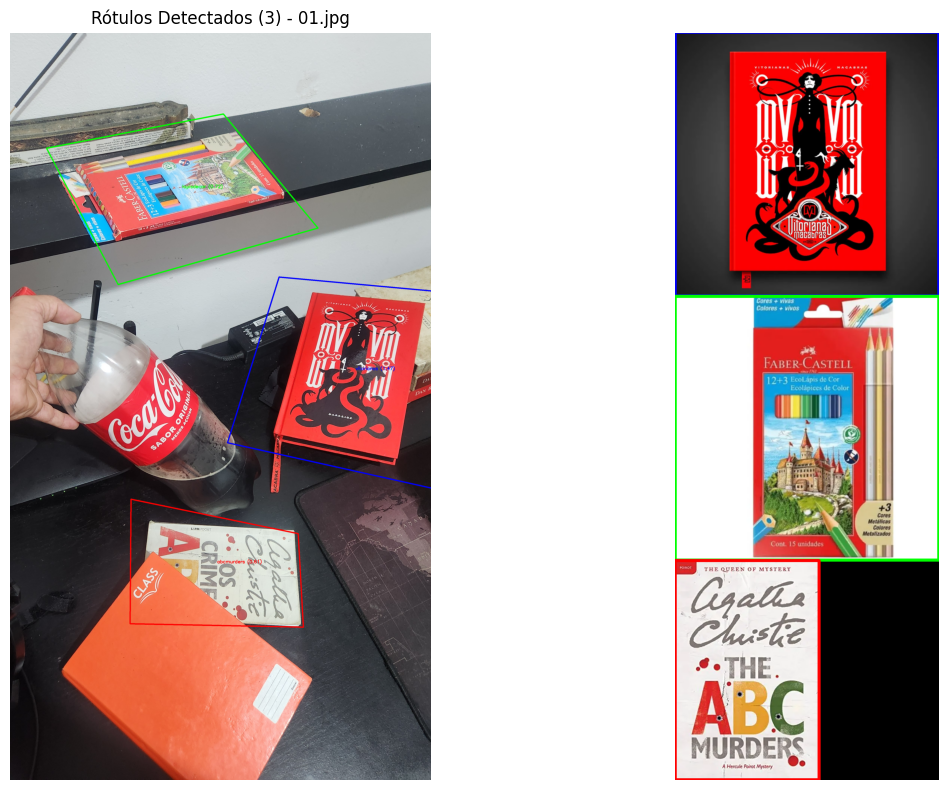

Tempo total: 23.71 s



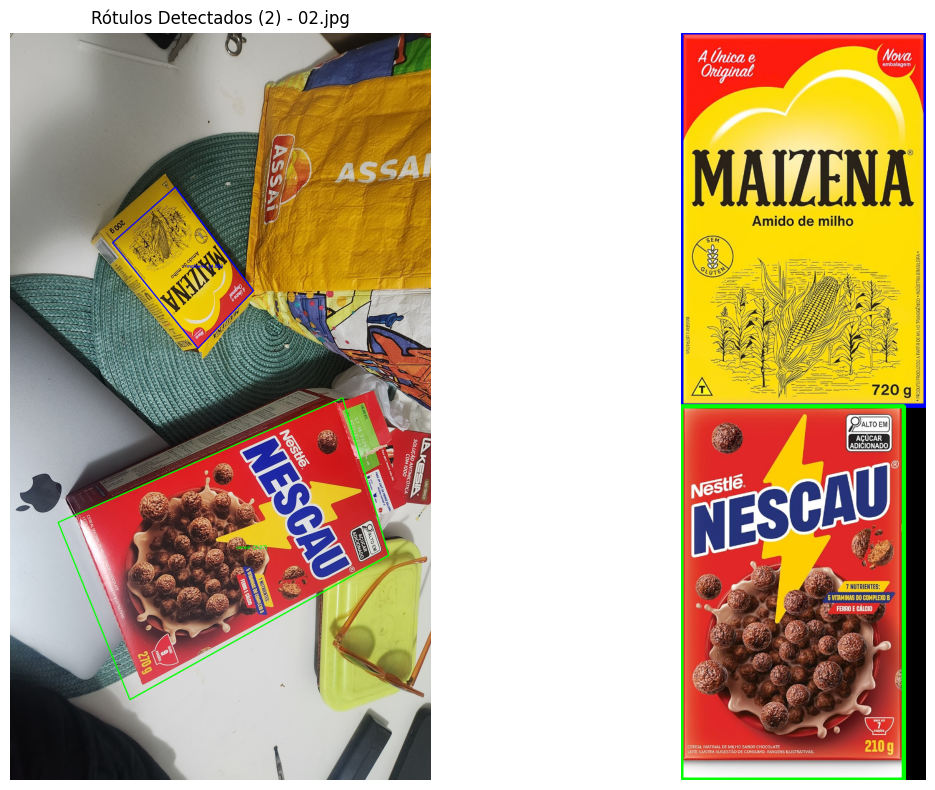

Tempo total: 26.00 s



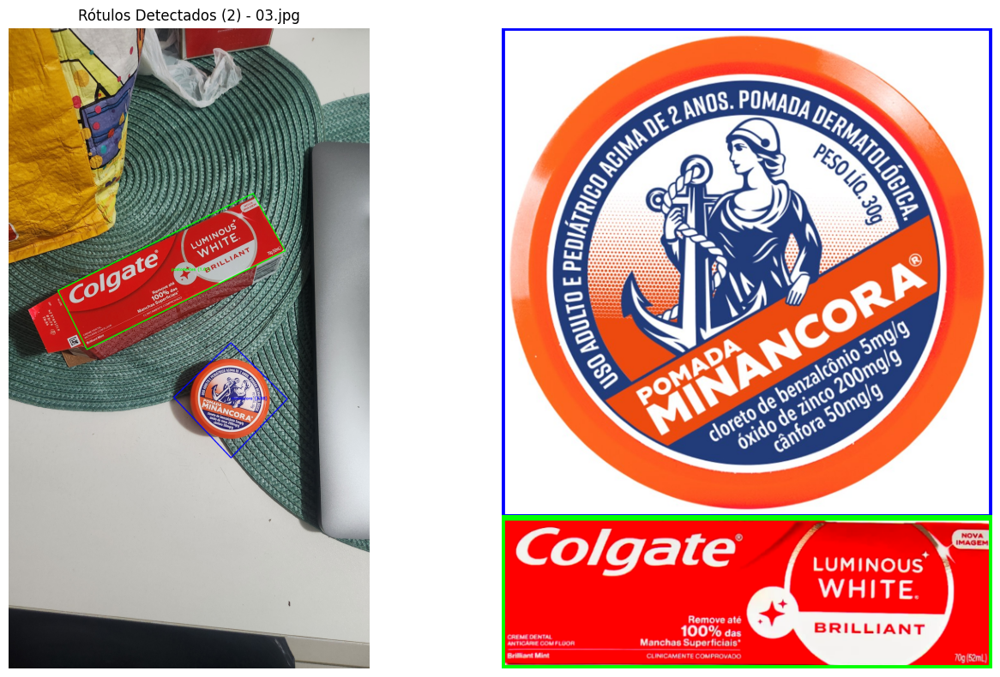

Tempo total: 27.99 s



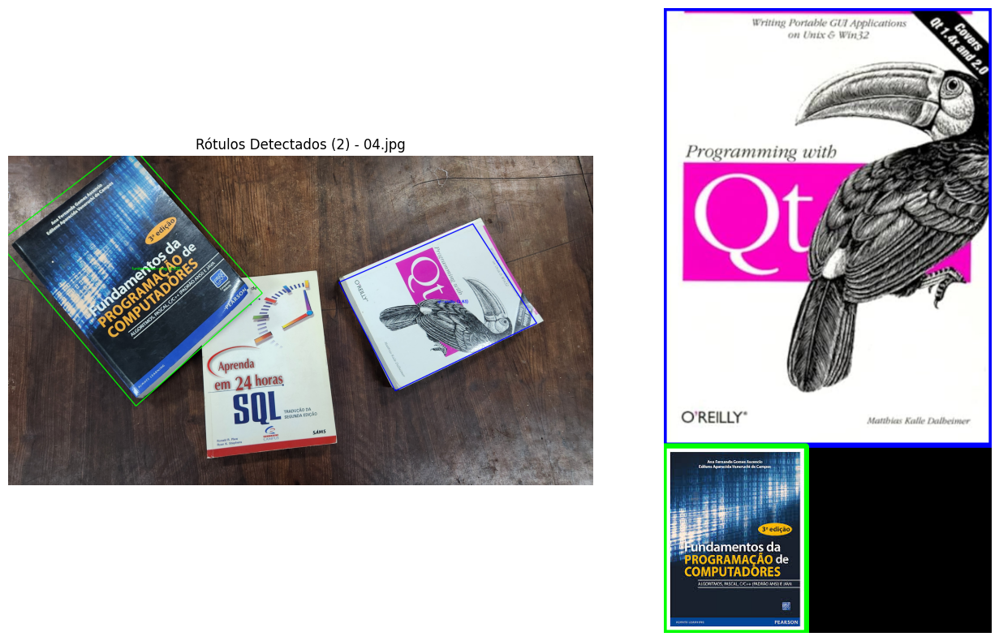

Tempo total: 33.93 s


Resumo final:
Imagem 01.jpg => [('vitorianas', '1.47'), ('lapisdecor', '0.72'), ('abcmurders', '0.61')]
Imagem 02.jpg => [('maizena', '4.69'), ('cereal', '3.27')]
Imagem 03.jpg => [('minancora', '3.68'), ('pastadentes', '1.61')]
Imagem 04.jpg => [('qt-oreilly', '2.83'), ('fundamentos-prog', '2.02')]


In [4]:
# QUESTÃO III:

def load_image_from_url(url):
      resp = urlopen(url)
      image = np.asarray(bytearray(resp.read()), dtype="uint8")
      image = cv.imdecode(image, cv.IMREAD_COLOR)
      return image

labels_directory = [
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/vitorianas.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/abcmurders.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/lapisdecor.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/cereal.jpg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/maizena.jpg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/minancora.jpeg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/pastadentes.png",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/qt-oreilly.jpg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/fundamentos-prog.jpeg"
        ]

find_folder = [
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/find/01.jpg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/find/02.jpg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/find/03.jpg",
    "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/rotulos/find/04.jpg"
    ]

def find_multiple_labels(labels_urls, product_image, confidence_threshold=0.1, max_results=5):
    start_time = time.time()
    max_dimension = 600

    if isinstance(product_image, str):
        if product_image.startswith('http'):
            product_img = load_image_from_url(product_image)
        else:
            product_img = cv.imread(product_image)
    else:
        product_img = product_image
        return []

    # Preprocess da imagem do produto
    gray_product = cv.cvtColor(product_img, cv.COLOR_BGR2GRAY)
    gray_product = cv.GaussianBlur(gray_product, (3, 3), 0)
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    gray_eq = clahe.apply(gray_product)
    sharpening_kernel = np.array([[0, -1, 0],
                                  [-1, 5, -1],
                                  [0, -1, 0]])
    gray_sharp = cv.filter2D(gray_eq, -1, sharpening_kernel)

    # SIFT - Detecta e descreve as features
    sift = cv.SIFT_create()
    product_keypoints, product_descriptors = sift.detectAndCompute(gray_sharp, None)

    detected_labels = []
    for label_url in labels_urls:
        # Extrair o nome do rótulo do arquivo
        label_name = os.path.splitext(os.path.basename(label_url))[0]

        # Carregar a imagem do rótulo
        if label_url.startswith('http'):
            label_img = load_image_from_url(label_url)
        else:
            label_img = cv.imread(label_url)

        if label_img is None:
            continue

        # Resize
        if max(label_img.shape[:2]) > max_dimension:
            scale = max_dimension / max(label_img.shape[:2])
            label_img = cv.resize(label_img, None, fx=scale, fy=scale)

        # Preprocess do rótulo
        gray_label = cv.cvtColor(label_img, cv.COLOR_BGR2GRAY)
        gray_label = cv.GaussianBlur(gray_label, (3, 3), 0)
        gray_label_eq = clahe.apply(gray_label)
        gray_label_sharp = cv.filter2D(gray_label_eq, -1, sharpening_kernel)

        # SIFT no rótulo
        label_keypoints, label_descriptors = sift.detectAndCompute(gray_label_sharp, None)
        if not label_keypoints or len(label_keypoints) < 4:
            continue

        # Matching
        matcher = cv.FlannBasedMatcher(dict(algorithm=1, trees=5), dict(checks=150))
        matches = matcher.knnMatch(label_descriptors, product_descriptors, k=2)
        good_matches = [m for m, n in matches if m.distance < 0.85 * n.distance]
        if len(good_matches) < 4:
            continue

        src_pts = np.float32([label_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([product_keypoints[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        H, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 10.0)
        if H is None or mask is None:
            continue

        inliers = [good_matches[i] for i in range(len(good_matches)) if mask[i] == 1]
        if len(inliers) < 4:
            continue

        # Homografia
        det = H[0,0] * H[1,1] - H[0,1] * H[1,0]
        if det <= 0.00001:
            continue

        scale_x = np.sqrt(H[0,0]**2 + H[1,0]**2)
        scale_y = np.sqrt(H[0,1]**2 + H[1,1]**2)
        ratio = scale_x / scale_y
        if not (0.2 < ratio < 5):
            continue

        confidence = len(inliers) / min(len(label_keypoints), 100)
        if confidence < confidence_threshold:
            continue

        h_label, w_label = label_img.shape[:2]
        corners = np.float32([[0, 0], [0, h_label-1],
                              [w_label-1, h_label-1], [w_label-1, 0]]).reshape(-1, 1, 2)
        transformed_corners = cv.perspectiveTransform(corners, H)
        rect = cv.minAreaRect(np.int32(transformed_corners))

        detected_labels.append({
            'name': label_name,
            'confidence': confidence,
            'homography': H,
            'corners': transformed_corners,
            'center': rect[0],
            'area': rect[1][0] * rect[1][1],
            'image': label_img
        })

    # Ordenar e limitar
    detected_labels.sort(key=lambda x: x['confidence'], reverse=True)
    detected_labels = detected_labels[:max_results]

    # Cores para diferenciar os rotulos
    colors = [(255,0,0),(0,255,0),(0,0,255),(255,255,0),
              (255,0,255),(0,255,255),(128,0,255),(255,128,0)]

    # Clonar draw das bounding boxes
    annotated_img = product_img.copy()
    for i, det in enumerate(detected_labels):
        color = colors[i % len(colors)]
        poly = np.int32(det['corners'])
        cv.polylines(annotated_img, [poly], True, color, 5)
        cx, cy = map(int, det['center'])
        cv.putText(
            annotated_img,
            f"{det['name']} ({det['confidence']:.2f})",
            (cx, cy),
            cv.FONT_HERSHEY_SIMPLEX, 0.8, color, 2
        )

    # Plot da imagem principal + rótulos ao lado
    fig = plt.figure(figsize=(14, 8))
    ax1 = fig.add_subplot(1, 2, 1)
    if isinstance(product_image, str):
        title = os.path.basename(product_image)
    else:
        title = "Imagem de Produto"
    ax1.set_title(f"Rótulos Detectados ({len(detected_labels)}) - {title}")
    ax1.imshow(cv.cvtColor(annotated_img, cv.COLOR_BGR2RGB))
    ax1.axis('off')

    # Subplot 2: miniaturas dos rótulos
    if detected_labels:
        combined_height = sum(img['image'].shape[0] for img in detected_labels)
        max_width = max(img['image'].shape[1] for img in detected_labels)
        labels_canvas = np.zeros((combined_height, max_width, 3), dtype=np.uint8)

        y_offset = 0
        for i, det in enumerate(detected_labels):
            label_img = det['image']
            h_l, w_l = label_img.shape[:2]
            colorscale = colors[i % len(colors)]

            labels_canvas[y_offset:y_offset+h_l, 0:w_l] = label_img

            # Draw bounding
            cv.rectangle(labels_canvas, (0, y_offset), (w_l-1, y_offset+h_l-1), colorscale, 5)

            y_offset += h_l

        ax2 = fig.add_subplot(1, 2, 2)
        ax2.imshow(cv.cvtColor(labels_canvas, cv.COLOR_BGR2RGB))
        ax2.axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Tempo total: {time.time() - start_time:.2f} s\n")
    return detected_labels

def process_find_images(labels_urls, find_urls, confidence_threshold, max_results):
    print(f"{len(labels_urls)} rótulos")
    print(f"{len(find_urls)} iamgens")

    all_results = {}
    for img_url in find_urls:
        results = find_multiple_labels(labels_urls, img_url, confidence_threshold, max_results)
        if results:
            all_results[img_url] = results

    return all_results

# Executar o processamento
all_detected = process_find_images(labels_directory, find_folder, confidence_threshold=0.5, max_results=3)

print("\nResumo final:")
for img_path, results in all_detected.items():
    if isinstance(img_path, str):
        img_name = os.path.basename(img_path)
    else:
        img_name = "Imagem"
    desc = [(x['name'], f"{x['confidence']:.2f}") for x in results]
    print(f"Imagem {img_name} => {desc}")

QUESTAO III: <br>
  (3.a) Construção da base de pelo menos 10 rótulos:<br>
Organizei um conjunto de 9 imagens de rótulos completamente diferentes (infelizmente uma não capturou). Armazenei todas  em uma pasta de input (./rotulos/), busquei também garantir que cada imagem tivesse um dimensionamento de no max 600px e passadas no detector.

  (3.b) Metodologia de matching e parametrizações:<br>
Primeiro, as imagens de rótulo são carregadas do gh, depois passamos elas pelo mesmo pipelone de pré-processamento que os rótulos foram passados:<br>
    - Conversão para gray scale.<br>
    - Aplicação de filtragem (blur) para suavizar ruídos.<br>
    - Equalização local (CLAHE) para melhorar o contraste.<br>
    - Sharpening para realçar bordas.<br>
    - Extraio keypoints e descritores com SIFT no produto e em cada rótulo.<br>
    - Emprego o FLANN para comparar descritores e, se houver matchs suficientes, calculo a homografia -usando RANSAC.<br>
    - Verifico a qualidade da homografia com métricas como det e ratio de escalas, descartando as que estiverem fora do intervalo.<br>
    - Cada rótulo detectado recebe uma confiança baseada no número de pontos correspondentes em relação às features disponíveis.<br>
    - Ordeno os rótulos por confiança, desenho contornos na imagem do produto e gero um mosaico de miniaturas dos rótulos encontrados.<br>

  (3.c) Testar com 4 imagens diferentes do produto:<br>
Para avaliar , testei com 3 fotos de produtos que estavam na base de rótulos, variando ângulos e iluminação. Registrei quantos rótulos foram corretamente identificados, como correspondências falsamente positivas em bordas irrelevantes dos rótulos ou falhas de detecção por pouca iluminação e qualidade dos inputs.
    - Nas imagens muito desfocadas ou com grande distorção de perspectiva, o fluxo de detecção e descrição pode falhar.<br>
    - No matching dos rótulos, situações com forte oclusão ou deformação levaram a homografias degeneradas ou poucas correspondências.<br>

In [ ]:
# QUESTAO IV:

image_url = "https://raw.githubusercontent.com/Delevati/vc-2024-2/main/img/task02/LoG/log.jpeg"

def load_image_from_url(url):
    with urlopen(url) as response:
        img_array = np.asarray(bytearray(response.read()), dtype=np.uint8)
        return cv.imdecode(img_array, cv.IMREAD_COLOR)

def log_multiscale_detection(img_gray, sigmas):
    volume = []

    for sigma in sigmas:
        blurred = cv.GaussianBlur(img_gray, (0, 0), sigma)
        lap = cv.Laplacian(blurred, cv.CV_32F, ksize=3)
        volume.append(lap)

    return np.stack(volume, axis=0)

fig, axes = plt.subplots(2, 3, figsize=(15, 8))

start_time = time.time()

img = load_image_from_url(image_url)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

sigmas = [3, 6, 9, 12, 15, 18]
volume = log_multiscale_detection(img_gray, sigmas)
marked = cv.cvtColor(img_gray, cv.COLOR_GRAY2BGR)

maxima_count = 0
for s in range(1, len(sigmas)-1):  # Ignora primeira e última escala
    for y in range(1, img_gray.shape[0]-1):  # Ignora bordas
        for x in range(1, img_gray.shape[1]-1):  # Ignora bordas
            val = volume[s, y, x]
            region_3d = volume[s-1:s+2, y-1:y+2, x-1:x+2]
            if val == region_3d.max() and val > 0:
                marked[y, x] = (0, 0, 255)
                maxima_count += 1

# Normaliza as imagens
for i, sigma in enumerate(sigmas):
    row, col = i // 3, i % 3
    normalized_lap = cv.normalize(volume[i], None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)
    axes[row, col].imshow(normalized_lap, cmap='gray')
    axes[row, col].set_title(f'LoG (sigma={sigma})')
    axes[row, col].axis('off')

processing_time = time.time() - start_time

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(cv.cvtColor(marked, cv.COLOR_BGR2RGB))
plt.title(f"Máximos Locais (total: {maxima_count})")
plt.axis('off')
plt.show()

print(f"LoG processing time: {processing_time:.2f} s")

QUESTAO IV: <br>
Para o LoG (Laplacian of Gaussian) primeiro aplicamos a Gaussiana para suavizar a imagem, dessa forma amenizamos um pouco do ruído inicial. Em seguida, chamamos o filtro Laplaciano (derivada de segunda ordem) que realça as bordas. A gente faz isso em várias escalas (como eu não pretendo mudar o tamanho de kernel, para verificr os maximos locais, estou mudando o sigma da Gaussiana), então cada escala mostra contornos de tamanhos diferentes. Sobre análise dos resultado, com sigma baixo (tipo 1), a suavização é menor e pode continuar com ruído; com sigma alto (tipo 6 ou 9), a imagem fica mais borrada, perdendo detalhes finos da imagem.

Pra checar se um ponto é máximo local, comparo o valor dele com seus vizinhos no espaço 3D (posição + escala). Se for maior que todos ao redor (cubo 3×3×3), marco como máximo. Assim, com o LoG detectamos os pontos de interesse em diferentes tamanhos na imagem.

Verificar o máximo local no espaço 3D (incluindo escala) é importante porque mostra que uma característica é realmente significativa não só em relação a seus vizinhos na mesma escala, mas também em escalas próximas. Isso nos dá um detector invariante à escala, ou seja, pode encontrar a mesma característica mesmo se a imagem for ampliada ou reduzida. Como pede a questão, ignoramos os pixels de borda e as escalas extremas, já que eles não têm vizinhança completa para comparação.